In [167]:
import os
import pandas
import wordcloud
import nibabel as nb
import nilearn.plotting as plotting
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
from scipy import stats
from scipy.spatial.distance import pdist, cdist
from brainsmash.mapgen.base import Base
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.metrics import normalized_mutual_info_score, adjusted_mutual_info_score, adjusted_rand_score
from sklearn.cluster import AgglomerativeClustering
from netneurotools.datasets import fetch_cammoun2012
from neuromaps.datasets import fetch_atlas, available_annotations, fetch_annotation

# Instructions for generating surfaces

The following steps will be necessary in order to do the surface-based analyses in this notebook.


1) **Download and install connectome workbench**: https://www.humanconnectome.org/software/get-connectome-workbench

2) **Generate component .nii images** -- these are generated in the NB3_PLSModelExploration.ipynb notebook. The images will be written to the /outputs directory of this git repo.

# Load data

In [9]:
wdir = 'surf/'
fig_dir = './figures/'

In [2]:
wb_command = 'wb_command'

## in case you don't have an alias for wbcommand, put the path to it here
## example: 
# wb_command = '/Users/jacobv/Downloads/workbench/bin_macosx64/wb_command'

In [4]:
#C1
os.system('gunzip surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii.gz')

cmd = '%s -volume-to-surface-mapping outputs/c1_xp_image.nii.gz surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C1_Smth0mm_gc.func.gii -enclosing'%wb_command
os.system(cmd)
cmd = '%s -metric-smoothing -fix-zeros surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C1_Smth0mm_gc.func.gii 5 surf/PLS_Volume_C1_Smth0mm_surf5mm_gc.func.gii'%wb_command
os.system(cmd)
#C2
cmd = '%s -volume-to-surface-mapping outputs/c2_xp_image.nii.gz surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C2_Smth0mm_gc.func.gii -enclosing'%wb_command
os.system(cmd)
cmd = '%s -metric-smoothing -fix-zeros surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C2_Smth0mm_gc.func.gii 5 surf/PLS_Volume_C2_Smth0mm_surf5mm_gc.func.gii'%wb_command
os.system(cmd)
#C3
cmd = '%s -volume-to-surface-mapping outputs/c3_xp_image.nii.gz surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C3_Smth0mm_gc.func.gii -enclosing'%wb_command
os.system(cmd)
cmd = '%s -metric-smoothing -fix-zeros surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii surf/PLS_Volume_C3_Smth0mm_gc.func.gii 5 surf/PLS_Volume_C3_Smth0mm_surf5mm_gc.func.gii'%wb_command
os.system(cmd)

0

In [10]:
#load in files
surf_obj=nb.load(os.path.join(wdir,'PLS_Volume_C1_Smth0mm_surf5mm_gc.func.gii'))
overlay1=surf_obj.darrays[0].data
# shift making positive to have greater control over colorbar with nilearn. 
# Otherwise will always be symmetric about 0

overlay1=overlay1-np.min(overlay1)

surf_obj=nb.load(os.path.join(wdir,'PLS_Volume_C2_Smth0mm_surf5mm_gc.func.gii'))
overlay2=surf_obj.darrays[0].data
overlay2=overlay2-np.min(overlay2)

surf_obj=nb.load(os.path.join(wdir,'PLS_Volume_C3_Smth0mm_surf5mm_gc.func.gii'))
overlay3=surf_obj.darrays[0].data
overlay3=overlay3-np.min(overlay3)

In [13]:
temppal = [sns.color_palette('cividis')[-2],
       sns.color_palette('viridis')[-2],
       sns.color_palette('magma')[-2]]

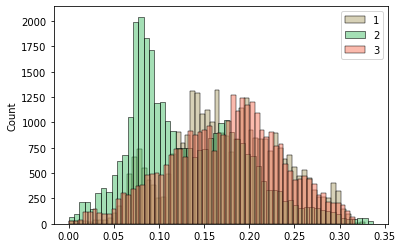

In [16]:
# show distribution of signal of each component in the cortex
sns.histplot(overlay1,label=1,color=temppal[0],alpha=0.5)
sns.histplot(overlay2,label=2,color=temppal[1],alpha=0.5)
sns.histplot(overlay3,label=3,color=temppal[2],alpha=0.5)
plt.legend()

# Plot individual images

In [17]:
surface = os.path.join(wdir,'fs_LR.32k.L.inflated.surf.gii.gz')

In [18]:
plotting.view_surf(surface,overlay1,
                   symmetric_cmap=False,cmap='cividis',
                  )

In [19]:
plotting.view_surf(surface,overlay2,
                   symmetric_cmap=False,cmap='viridis',
                  )

In [20]:
plotting.view_surf(surface,overlay3,
                   symmetric_cmap=False,cmap='magma',
                  )

# Make a vertex-wide atlas of gradient interactions

NOTE: Because clustering is a stochastic process, and because I failed to set a random state before doing this analysis, you may get *slightly* different results than I did. To reproduce the findings from the manuscript perfectly, skip the next few cell and load the labels image in the cell below (that says LOAD RESULTS FROM MANUSCRIPT). Otherwise, the next few cells illustrate the exact commands run to produce that output.

In [21]:
# make the data into a vertex x component matrix

from sklearn.preprocessing import MinMaxScaler
surfmat = np.concatenate([overlay1.reshape(-1,1),
                          overlay2.reshape(-1,1),
                          overlay3.reshape(-1,1)],
              axis=1)
rgb_conv = MinMaxScaler().fit_transform(surfmat).round(3)

In [22]:
rgb_conv.shape

(32492, 3)

In [25]:
# run hierarchichal agglomerative clustering with k=2-15, and
# save cluster evaluation metrics
csol = pandas.DataFrame()
for i,k in enumerate(range(2,15)):
    print('working on k =',k)
    d = rgb_conv
    cluster = AgglomerativeClustering(n_clusters=k, affinity='euclidean', 
                                  linkage='ward')
    cluster.fit_predict(d)
    csol.loc[i,'k'] = k
    csol.loc[i,'sil_score'] = silhouette_score(d,cluster.labels_,random_state=123)
    csol.loc[i,'ch_score'] = calinski_harabasz_score(d,cluster.labels_)

Evaluate clustering solutions

In [ ]:
sns.pointplot(x='k',y='sil_score',data=csol)

In [ ]:
sns.pointplot(x='k',y='ch_score',data=csol)

Six cluster solution pretty definitive winner. Let's get the vertex-wise labels

In [ ]:
cluster = AgglomerativeClustering(n_clusters=6, affinity='euclidean', 
                                  linkage='ward')
cluster.fit_predict(rgb_conv)
labs = cluster.labels_

In [26]:
## LOAD RESULTS FROM MANUSCRIPT
# Loading these data will load the exact results used in the manuscript.
# Skip this cell if you want to use data you just generated with the above cells.

labs = np.load('PLS_comp_vertex_cluster_labels.npz')['arr_0']
labs

array([2, 2, 0, ..., 5, 5, 5])

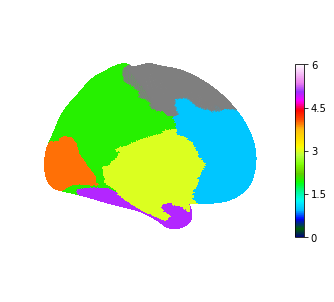

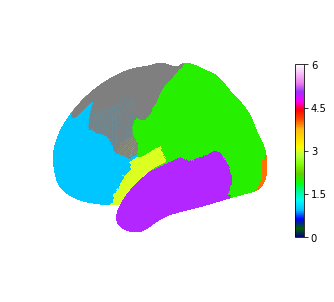

In [27]:
# visualize clusters
plotting.plot_surf_roi(surface,labs,cmap='gist_ncar',
                      colorbar=True,view='medial')
plt.show()
plotting.plot_surf_roi(surface,labs,cmap='gist_ncar',
                      colorbar=True,view='lateral')
plt.show()

In [29]:
plotting.view_surf(surface,labs,
                   symmetric_cmap=False,cmap='tab10',
                  )

#### Get the gradient concentrations of each cluster

In [30]:
# z-score gradient values for easier display
zsurf = pandas.DataFrame(StandardScaler().fit_transform(surfmat),
                         columns = ['C1','C2','C3'])
zsurf.loc[:,'labels'] = labs

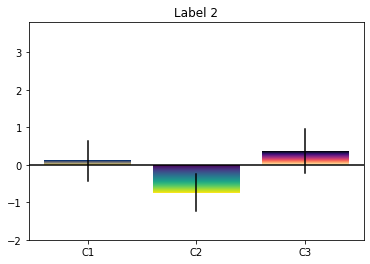

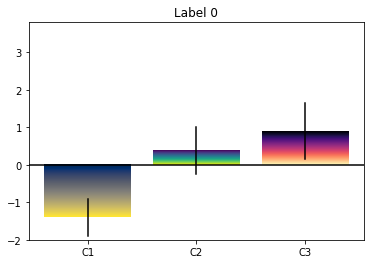

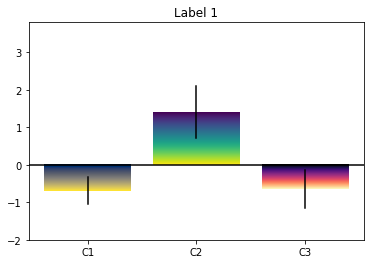

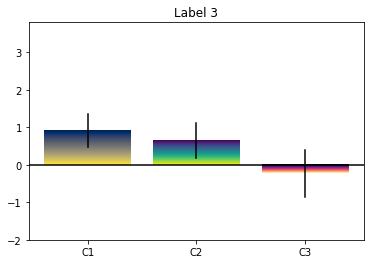

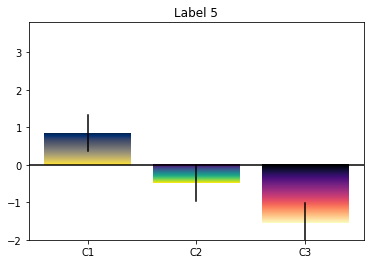

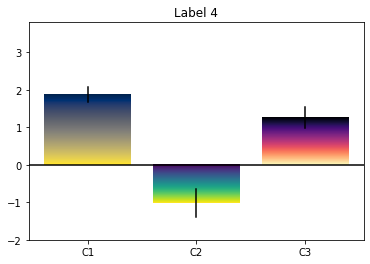

In [31]:
def gradientbars(bars,cmaps):
    '''function to make gradients inside barplots
    bars = an instance of plt.bar 
    cmaps = preferred colormaps for gradients
    '''
    grad = np.atleast_2d(np.linspace(0,1,256)).T
    ax = bars[0].axes
    lim = ax.get_xlim()+ax.get_ylim()
    for i,bar in enumerate(bars):
        bar.set_zorder(1)
        bar.set_facecolor("none")
        x,y = bar.get_xy()
        w, h = bar.get_width(), bar.get_height()
        ax.imshow(grad, extent=[x,x+w,y,y+h], aspect="auto", zorder=0,cmap=cmaps[i])
    ax.axis(lim)

cmaps = ['cividis','viridis','magma']
# for each cluster
for lab in zsurf.labels.unique():
    # get values within cluster
    ldf = pandas.DataFrame(zsurf[zsurf.labels==lab],copy=True)
    # for each gradient, get dimensions and CIs of the bar in the barplot
    ldf.loc[:,'ind'] = range(len(ldf))
    ldf = ldf.melt('ind',['C1','C2','C3'],'component','expr')
    btms = []
    hts = []
    cis = []
    for c in ['C1','C2','C3']:
        vals = ldf[ldf.component==c]['expr'].values
        mn = np.mean(vals) # mean
        cis.append([(mn+np.std(vals)),(mn-np.std(vals))]) # sd
        # since reference is 0, need to do this differently for pos and neg means
        if mn < 0: 
            btms.append(mn)
            hts.append(mn*-1)
        else:
            btms.append(0)
            hts.append(mn)
    # make the barplot
    fig, ax = plt.subplots()
    bar = ax.bar(['C1','C2','C3'],hts, bottom=btms)
    # color bars with gradients
    gradientbars(bar,cmaps)
    # add confidence intervals
    for i in range(3):
        plt.plot([i,i],cis[i],c='k')
    # decorate and harmonize y axis
    plt.title('Label %s'%lab)
    plt.axhline(0,c='k')
    plt.ylim(-2,3.8)
#     plt.savefig(os.path.join(fig_dir,'CortClustConc_%s.pdf'%lab,
#            bbox_inches='tight')
    plt.show() 

# Comparison to lobar map
These molecular territories look a lot like the canonical lobes of the brain. Let's make a direct comparison

In [151]:
# Let's load up a mapping of Glasser parcellation to lobes
glabs2 = pandas.read_csv('data/GlasserLobeMapping.csv')
for i,row in glabs2.iterrows():
    roi = 'Right_'+row['Glasser ROI']
    ind = glabs[glabs[0]==roi].index
    featdf.loc[ind,'Lobe'] = row['Lobe']
    featdf.loc[ind,'Lobelabel'] = row['Lobe(#)']

Lobelabel


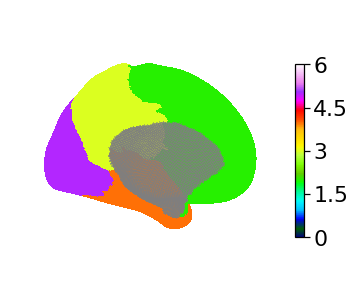

parcels


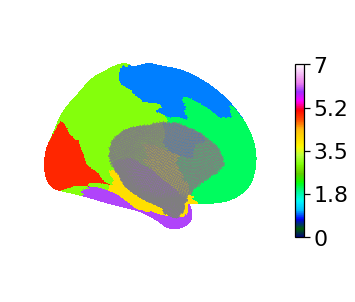

In [165]:
# project lobes and molecular territories
roikey = dict(zip(range(len(featdf)),np.unique(glasser)[1:]))
for feat in ['Lobelabel','parcels']:
    print(feat)
    vals_tfm = (featdf.loc[:,feat].values + 1).reshape(-1,1)[:,0]
    dat = np.zeros_like(glasser).astype(float)
    for i in glabs2.index:
        dat[glasser==roikey[(i)]] = vals_tfm[i]
    plotting.plot_surf_roi(surface,dat,cmap='gist_ncar',
                      colorbar=True,view='medial')
#     plt.savefig(os.path.join(fig_dir,'Surf_%s_LH.pdf'%feat.replace('/','')),
#                bbox_inches='tight')
    plt.show()

Define empirical socres representing similarity between these two parcellations

In [168]:
adjusted_mutual_info_score(featdf.Lobelabel.values,featdf.parcels.values)

0.5717823873096651

In [169]:
adjusted_rand_score(featdf.Lobelabel.values,featdf.parcels.values)

0.45707182548590464

#### Spin test
Let's now make sure that these relationships are not just a matter of spatial autocorrelation

In [143]:
## 10000 spun versions of the glasser parcellation
spins = pandas.read_csv('data/glasser_spins.csv')

In [170]:
ami_nulls = [] # container for spun parcellations
for col in spins.columns[:1000]: # first 1000 permutations
    # run the AMI score between the lobar map and the spun molecular territory map
    spun = featdf.loc[[(x-1) for x in spins[col].values if x < 181],'parcels'].values
    ami_nulls.append(adjusted_mutual_info_score(spun,featdf['Lobelabel']))

Text(0.5, 1.0, 'Lobes')

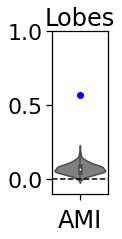

In [171]:
# now plot the null distribution vs the empirical value
ami = adjusted_mutual_info_score(featdf.Lobelabel.values,featdf.parcels.values)
plt.subplots(figsize=(1,3))
sns.violinplot(y=ami_nulls,color='gray')
plt.ylim(-0.1,1)
plt.axhline(0,ls='--',c='k')
plt.scatter(y=[ami],x=[0],c='b')
plt.xlabel('AMI')
plt.title('Lobes')
# plt.savefig(os.path.join(fig_dir,'Lobar_AMI_null.pdf'),bbox_inches='tight')

Text(0.5, 1.0, 'Lobes')

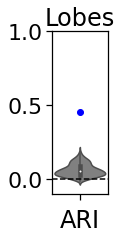

In [172]:
# Let's repeat for ARI

ari_nulls = []
for col in spins.columns[:1000]:
    spun = featdf.loc[[(x-1) for x in spins[col].values if x < 181],'parcels'].values
    ari_nulls.append(adjusted_rand_score(spun,featdf['Lobelabel']))

ari = adjusted_rand_score(featdf.Lobelabel.values,featdf.parcels.values)
plt.subplots(figsize=(1,3))
sns.violinplot(y=ari_nulls,color='gray')
plt.ylim(-0.1,1)
plt.axhline(0,ls='--',c='k')
plt.scatter(y=[ari],x=[0],c='b')
plt.xlabel('ARI')
plt.title('Lobes')
#plt.savefig(os.path.join(fig_dir,'Lobar_ARI_null.pdf'),bbox_inches='tight')

# Gradient clusters, brain features and fMRI Principle Gradient

In [32]:
# a bunch of brain features in Glasser atlas from Sydnor et al., 2021 Neuron
featdf = pandas.read_csv('./data/stat_maps.csv')
featdf.columns

Index(['asl', 'glasser_CMRO2', 'glasser_CMRGlu', 'glasser_CBV', 'glasser_CBF',
       'hill.evo_remapped', 'hill.dev_remapped', 'glasser_GI', 'x', 'y', 'z',
       'externopyramidisation', 'thickness', 'curvature', 'PC1_AHBA',
       'PC1_neurosynth', 'T1T2', 'G1_fMRI', 'CBF', 'allom', 'geodist'],
      dtype='object')

#### glasserize this gradient
First, need to get the gradient in glasser space for comparison

In [33]:
glasser = pandas.read_csv('./surf/glasser_vector.csv', header = None)
glasser = np.array(glasser[0].values)
glabs = pandas.read_csv('./surf/glasser_labels.csv', header=None)

In [34]:
glasser.shape

(59412,)

There is a discrepancy between the fslr32k vector and the glasser vector, the latter in "grayordinates" (:eyeroll:) or whatever. The next few cells address this discrepancy

In [35]:
mwlh = pandas.read_csv('./surf/medialwall_mask_LH.csv',
                      header=None)
mwrh = pandas.read_csv('./surf/medialwall_mask_RH.csv',
                      header=None)
mwfull = pandas.concat([mwlh,mwrh])
mwfull.shape

(64984, 1)

In [36]:
garr = np.zeros(mwfull.shape[0])
boolarr = mwfull[0].values

print(garr[boolarr].shape)
print(glasser.shape)

(59412,)
(59412,)


In [37]:
garr[boolarr] = glasser
garrlh = garr[:len(mwlh)]

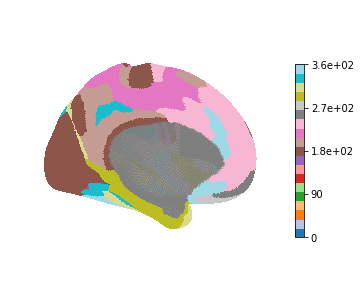

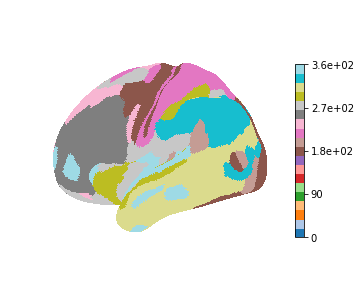

In [38]:
# plot glasser on surf to make sure we're good
plotting.plot_surf_roi(surface,garrlh,cmap='tab20',
                      colorbar=True,view='medial')
plt.show()
plotting.plot_surf_roi(surface,garrlh,cmap='tab20',
                      colorbar=True,view='lateral')
plt.show()

In [39]:
glasser = garrlh.astype(int)

In [40]:
glabs.head()

,0
0,Right_V1
1,Right_MST
2,Right_V6
3,Right_V2
4,Right_V3


In [41]:
# move the gradients clusters to glasser rois using winner-takes-all
glassified = np.zeros(len(np.unique(glasser))-1)
gfied_surf = np.zeros_like(glasser)
for i,parc in enumerate(np.unique(glasser)):
    if parc==0: continue
    a=labs[glasser==parc]
    counts = np.bincount(a)
    winner = np.argmax(counts)
    glassified[i-1] = winner
    gfied_surf[glasser==parc] = winner+1

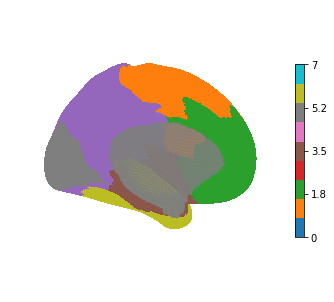

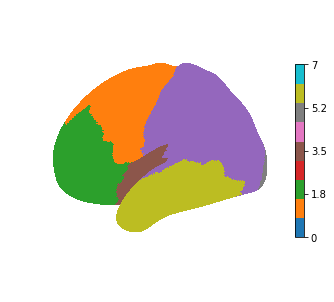

In [42]:
# how did we do?
plotting.plot_surf_roi(surface,gfied_surf,cmap='tab10',
                      colorbar=True,view='medial')
plt.show()
plotting.plot_surf_roi(surface,gfied_surf,cmap='tab10',
                      colorbar=True,view='lateral')
plt.show()

In [43]:
# add it to the feature df
featdf.loc[:,'parcels'] = glassified

#### Get Hansen et al., 2021 map!

Some of what we're doing below is relevant to findings from Hansen et al. 2021. We will gather one of the maps from this paper for subsequent analysis. See here for more details: 10.1038/s41562-021-01082-z

In [44]:
# here are the values from the paper, but they are in Cammoun2012 space!
pls = pandas.read_csv('./data/Hansen2021_term_scores.csv',
                     index_col=0)
pls.head()

,term_score
label,
lateralorbitofrontal_1,-8.4601
lateralorbitofrontal_2,-7.6630
lateralorbitofrontal_3,-5.6323
lateralorbitofrontal_4,-3.9036
parsorbitalis_1,-4.6026


The data from Hansen et al., 2021 used a different atlas: Cammoun 2012. They/we also did things in volumetric space, and we're in surface space here. Luckily, the Cammoun 2012 atlas in netneurotools has a surface version as well!

In [45]:
cammoun = fetch_cammoun2012()
info = pandas.read_csv(cammoun['info'])
scammoun = fetch_cammoun2012(version='fslr32k')

In [46]:
leftcortex = info.query('scale == "scale125" & structure == "cortex" & hemisphere == "L"')['id']

Now we need to do a comparison between the surface version and the volumetric version used in the paper

In [47]:
# how many surface labels also in the volumetric verison?
len(set(leftcortex.values) & set(np.unique(nb.load(cammoun.scale125).get_fdata())))

111

In [48]:
lausL = scammoun.scale125.lh
surf_obj=nb.load(lausL)
lausL=surf_obj.darrays[0].data

In [49]:
# after excluding 0, looks like we have 
# one extra label in the surface version...
len(np.unique(lausL.tolist())) - 1 

112

after some searching, I realized there is a corpus callosum label that needs to be removed from the surface atlas to make this work:

In [50]:
test = np.zeros_like(lausL)
test[lausL==4] = 1

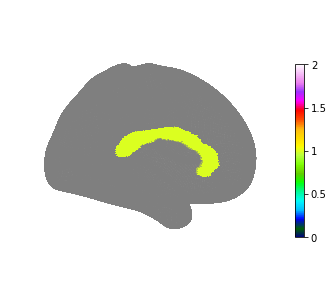

In [51]:
plotting.plot_surf_roi(surface,test,cmap='gist_ncar',
                      colorbar=True,view='medial')
plt.show()

In [52]:
# now just a quick mapping between volumetric and surface labels
mapping = dict(zip(pls.index, 
                   [1,2,3] + list(range(5,113)))) # remove corpus callosum which is 4
len(mapping)

111

In [53]:
# just a quick check to show we're excluding 0 (not cortex) and 4 (CC)
set(lausL) - set(list(mapping.values()))

{0, 4}

In [54]:
# lets check our work by projecting the Hansen 2021 values to the 
# Cammoun 2012 surface
hansen = np.zeros_like(lausL).astype(float)
for reg,lab in mapping.items():
    val = pls.loc[reg,'term_score']
    if val>0:
        val += 1
    else:
        val -= 1
    hansen[lausL==lab] = val 

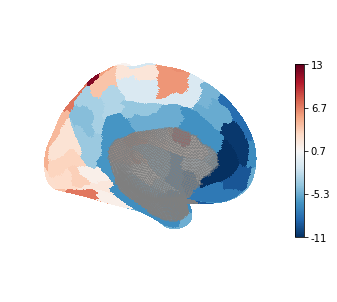

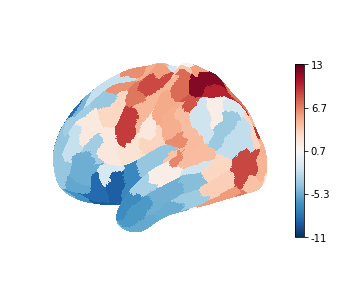

In [55]:
plotting.plot_surf_roi(surface,hansen,cmap='RdBu_r',
                      colorbar=True,view='medial')
plt.show()
plotting.plot_surf_roi(surface,hansen,cmap='RdBu_r',
                      colorbar=True,view='lateral')
plt.show()

In [ ]:
# gpg_surf -- fmri gradient
# gfied surf -- molec gradient

In [56]:
# now lets get the glasserized version of this (just take the mean
# of values within each glasser parcel)
ghansen = np.zeros_like(hansen).astype(float)
for lab in np.unique(glasser):
    if lab==0: continue
    ghansen[glasser==lab] = hansen[glasser==lab].mean()

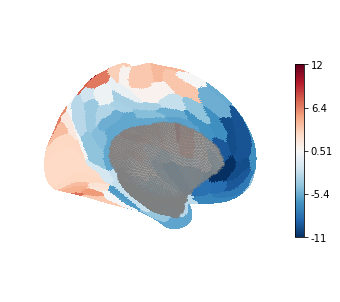

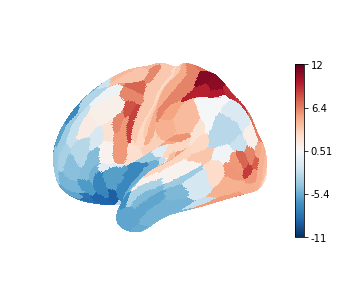

In [57]:
plotting.plot_surf_roi(surface,ghansen,cmap='RdBu_r',
                      colorbar=True,view='medial')
plt.show()
plotting.plot_surf_roi(surface,ghansen,cmap='RdBu_r',
                      colorbar=True,view='lateral')
plt.show()

In [58]:
# and add it to the feature df
for i,lab in enumerate(np.unique(glasser)[1:]):
    featdf.loc[i,'hansen'] = ghansen[glasser==lab][0]

# Load MEG data

In [66]:
# some neuromaps magic

megs = [x for x in neuromaps.datasets.available_annotations() if 'meg' in x[1]]
annots = neuromaps.datasets.fetch_annotation(source=['hcps1200'])

In [67]:
megs

[('hcps1200', 'megalpha', 'fsLR', '4k'),
 ('hcps1200', 'megbeta', 'fsLR', '4k'),
 ('hcps1200', 'megdelta', 'fsLR', '4k'),
 ('hcps1200', 'meggamma1', 'fsLR', '4k'),
 ('hcps1200', 'meggamma2', 'fsLR', '4k'),
 ('hcps1200', 'megtheta', 'fsLR', '4k'),
 ('hcps1200', 'megtimescale', 'fsLR', '4k')]

In [76]:
# A little script to resample the data into the correct space

def fs_resample(sphere_from,sphere_to,vector):
    if type(vector) != np.ndarray: 
        vector = np.array(vector)
    s1 = nb.load(sphere_from).darrays[0].data
    if len(vector) != len(s1):
        raise ValueError("arg 'vector' must be the same length as 'sphere_from' data")
    s2 = nb.load(sphere_to).darrays[0].data
    distances = cdist(s1,s2)
    mapping = np.argmin(distances,axis=0)
    newvec = vector[mapping]
    
    return newvec

In [77]:
fs4k = fetch_atlas('fsLR','4k')
fs32k = fetch_atlas('fsLR','32k')
fs4 = fs4k['sphere'][0]
fs32 = fs32k['sphere'][0]

megmaps = {}

for meg in megs:
    nm = meg[1]
    print('working on',nm)
    jnk = nb.load(annots[meg][0]).darrays[0].data
    newvec = fs_resample(fs4,fs32,jnk)
    megmaps.update({nm: newvec})
    for i,lab in enumerate(np.unique(glasser)[1:]):
        featdf.loc[i,nm] = np.mean(newvec[glasser==lab])

working on megalpha
working on megbeta
working on megdelta
working on meggamma1
working on meggamma2
working on megtheta
working on megtimescale


### 3 Gradient Margulies vs 3 Components
As mentioned above, its not really "fair" to parcellate the principal gradient, as it has a scalar representation across the brain. Better to compare against actual gradient values. But since we're using 3 gradients, we will also use the top 3 Margulies 2016 PNAS fMRI principal gradients

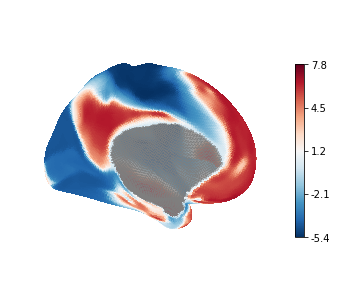

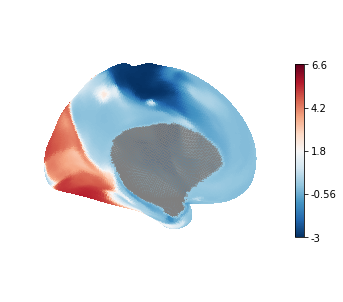

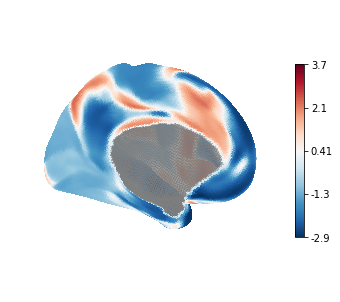

In [63]:
# Lets have a look at those gradients and save a picture!
for g in range(1,4):
    os.system('gunzip surf/MarguliesGrad_%sL.gii.gz'%g)
    surf_obj=nb.load('surf/MarguliesGrad_%sL.gii'%g)
    marg=surf_obj.darrays[0].data
    plotting.plot_surf_roi(surface,marg,cmap='RdBu_r',
                          colorbar=True,view='medial')
#     plt.savefig(os.path.join(fig_dir,'MarGrad%s.png'%g),
#            bbox_inches='tight')
    plt.show()

In [64]:
# load gradients and add to feature df
for g in range(1,4):
    surf_obj=nb.load('./surf/MarguliesGrad_%sL.gii'%g)
    marg=surf_obj.darrays[0].data
    for i,lab in enumerate(np.unique(glasser)[1:]):
        featdf.loc[i,'MargGrad%s'%g] = np.mean(marg[glasser==lab])

In [65]:
# separately obtain glasser ROI values for each of the 3 cortical gradients
for c,olay in {1:overlay1,2:overlay2,3:overlay3}.items():
    for i,lab in enumerate(np.unique(glasser)[1:]):
        featdf.loc[i,'TxGrad%s'%c] = np.mean(olay[glasser==lab])

In [94]:
# sub-select features of interest
# All maps from Sydnor et al., 2021 Neuron
#    * except fMRI gradient because we're using it as an IV
#    * plus the cog map from Hansen et al., 2021 Nat Hum Beh
#    * plus geometric distance (e.g. from Margulies et al., 2016 PNAS)
cols = ['T1T2','hill.evo_remapped','hill.dev_remapped','allom','CBF','PC1_neurosynth',
       'externopyramidisation','glasser_GI','thickness','PC1_AHBA','hansen','geodist',
       'megtimescale']

In [95]:
# give them better names
cnames = dict(zip(cols,
                 ['T1/T2','EvoExp','DevExp','AlloScal','CBF','Neurosynth-PC1',
                 'ExternPyr','AerGlyc','CortThx','AHBA-PC1','Hansen2021','GeoDist',
                 'MEG TS']))

The objective here is to fit simple linear models where either the 3 principal fMRI gradients or the 3 Tx PLS components (or both sets) are independent variables, and each feature map is set as the dependent variable. Here we can find the variance in the feature that is explained by these two cortical organizing principals, separately or combined. 

In [96]:

# Make a version of the df and feature names that 
# statsmodels won't complain about
featdf2 = pandas.DataFrame(featdf,copy=True)
newcols = [cnames[x] if x in cnames.keys() else x for x in featdf2.columns]
newcols = [x.replace('-','').replace('/','').replace('.','') for x in featdf2.columns]
cnames2 = dict(zip(featdf.columns,newcols))
featdf2.columns = newcols

# store results
regr = pandas.DataFrame()
count=0
conds = ['fMRI','Tx','both']
# for each feature
for feat in cols:
    for cond in conds:
        # just fmri gradients as regressors
        if cond=='fMRI':
            mod = smf.ols('%s ~ MargGrad1 + MargGrad2 + MargGrad3'%cnames2[feat],data=featdf2).fit()
        # just Tx Components as regressors    
        elif cond == 'Tx':
            mod = smf.ols('%s ~ TxGrad1 + TxGrad2 + TxGrad3'%cnames2[feat],data=featdf2).fit()
        elif cond == 'both':
            mod = smf.ols('%s ~ TxGrad1 + TxGrad2 + TxGrad3 + MargGrad1 + MargGrad2 + MargGrad3'%cnames2[feat],
                          data=featdf2).fit()
        # store name and full model r square
        regr.loc[count,'y'] = cnames[feat]
        regr.loc[count,'cond'] = cond
        regr.loc[count,'r2'] = mod.rsquared
        count += 1

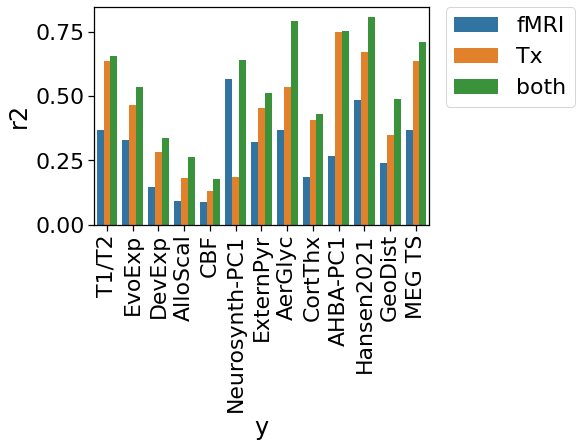

In [97]:
# results
g = sns.barplot(x='y',y='r2',hue='cond',data=regr)
g.set_xticklabels(g.get_xticklabels(),rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

Text(15.439999999999998, 0.5, 'R$^2$ (fMRI Gradient)')

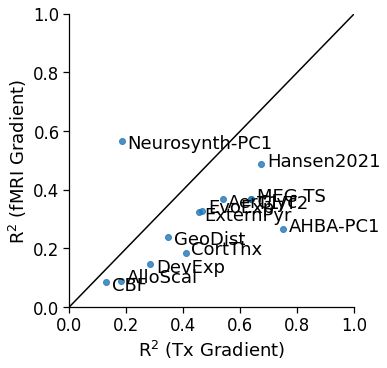

In [98]:
# plot comparing the r-values
sns.set_context('notebook',font_scale=1.5)
a = regr[regr.cond=='Tx']['r2'].tolist()
b = regr[regr.cond=='fMRI']['r2'].tolist()
jnk = pandas.concat([pandas.Series(a),pandas.Series(b)],axis=1)
jnk.columns = ['MolGrad','fMRIGrad']
spg = sorted(b)

sns.lmplot(x='MolGrad',y='fMRIGrad',data=jnk,fit_reg=False)
plt.xlim(0,1)
plt.ylim(0,1)
plt.plot([0,1],[0,1],c='k')
for n,s in enumerate(spg):
    i = b.index(s)
    if n % 2 == 0:
        plt.text(a[i]+0.02,b[i]+0.02,cnames[cols[i]],va='top')
    else:
        plt.text(a[i]+0.02,b[i]-0.02,cnames[cols[i]],va='bottom')
plt.xlabel('R$^2$ (Tx Gradient)')
plt.ylabel('R$^2$ (fMRI Gradient)')
# plt.savefig(os.path.join(fig_dir,'GradientComparison_regr.pdf'),
#            bbox_inches='tight')

#### Bootstrap
Results above are nice but would be better if we could generate some confidence intervals, which will let us make claims about difference

In [99]:
catch = []
n_iter = 100 # 100 bootstrap samples
conds = ['fMRI','Tx','both']
for i in range(n_iter):
    # keep track
    if i % 10 == 0: print('working on %s of %s'%((i+1),n_iter))
    # make a random bootstrap sample of the parcels
    rand = np.random.RandomState(123+i)
    samp = rand.choice(featdf2.index,len(featdf2.index),replace=True)
    Bfeats = pandas.DataFrame(featdf2.loc[samp],copy=True)
    Bregr = pandas.DataFrame()
    # run the model
    count=0
    for feat in cols:
        for cond in conds:
            if cond=='fMRI':
                mod = smf.ols('%s ~ MargGrad1 + MargGrad2 + MargGrad3'%cnames2[feat],data=Bfeats).fit()
            elif cond == 'Tx':
                mod = smf.ols('%s ~ TxGrad1 + TxGrad2 + TxGrad3'%cnames2[feat],data=Bfeats).fit()
            elif cond == 'both':
                mod = smf.ols('%s ~ TxGrad1 + TxGrad2 + TxGrad3 + MargGrad1 + MargGrad2 + MargGrad3'%cnames2[feat],
                              data=Bfeats).fit()
            Bregr.loc[count,'y'] = cnames[feat]
            Bregr.loc[count,'cond'] = cond
            Bregr.loc[count,'r2'] = mod.rsquared
            count += 1
    Bregr.loc[:,'iter'] = i
    catch.append(Bregr) # store results

working on 1 of 100
working on 11 of 100
working on 21 of 100
working on 31 of 100
working on 41 of 100
working on 51 of 100
working on 61 of 100
working on 71 of 100
working on 81 of 100
working on 91 of 100


In [100]:
Bregr = pandas.concat(catch) # put it all together

In [101]:
# order plots by r2 of molecular gradient

# order = jnk[jnk.cond=='Tx'].sort_values('r2',ascending=False).y.values
order = Bregr[Bregr.cond=='Tx'].groupby('y').mean().sort_values('r2',
                                                        ascending=False
                                                       ).index

In [102]:
# create dataframe where fMRI values are negative for horizontal plot
jnk2 = pandas.DataFrame(Bregr,copy=True)
jnk2.loc[jnk2.cond=='fMRI','r2'] = jnk2.loc[jnk2.cond=='fMRI','r2'].values * -1

In [103]:
jnk = pandas.DataFrame(regr[regr.cond!='both'],copy=True)

In [117]:
## CAREFUL!! The label ordering for a few of these can change if you change the random
## seed for the bootstrap. Make sure it's correct!
even_cleaner_labels = ['AHBA-PC1','Tx/Cog PLSY','Tw1/T2w Ratio','MEG Timescale',
                      'Aer. Glyc.','Evo. Exp.','Externopyr.',
                       'Cort. Thx','Geo. Distance','Dev. Exp.','Allo. Scaling',
                        'Neurosynth-PCA','CBF',]

AHBA-PC1 is significant
Hansen2021 is significant
T1/T2 is significant
MEG TS is significant
AerGlyc is significant
EvoExp is significant
ExternPyr is significant
CortThx is significant
DevExp is significant
Neurosynth-PC1 is significant


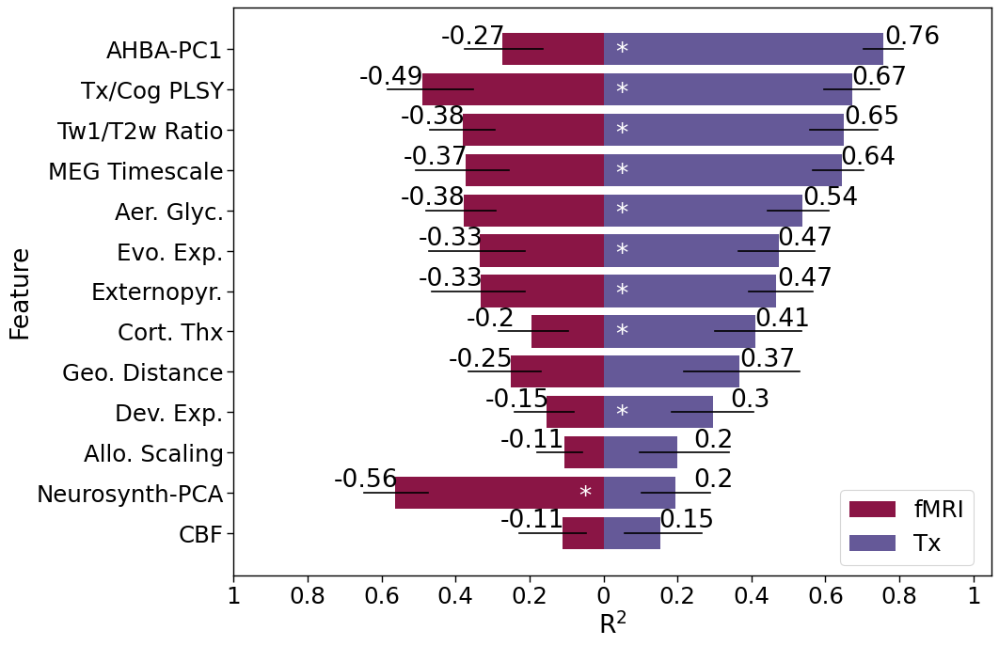

In [118]:
# Horizontal dual barplots!

# prep for plot
sns.set_context('notebook',font_scale=2)
cond = 'cond'
plt.figure(figsize=(13,10), dpi= 80)
order_of_bars = order
colors = [plt.cm.Spectral(i/float(len(jnk[cond].unique())-1)) for i in range(len(jnk[cond].unique()))]

# for the two conditions of interest
for c, group in zip(colors, jnk[cond].unique()):
    # plot the bar
    g = sns.barplot(y='y', x='r2', data=jnk2.loc[jnk2[cond]==group, :],ci=None, 
                order=order_of_bars, color=c, label=group,orient='h')  
    # for each feature
    for i in range(len(order_of_bars)):
        # get CIs from the bootstrap data
        distr = sorted(jnk2[(jnk2.cond==group) & (jnk2.y==order_of_bars[i])]['r2'].values)
        plt.plot([distr[2],distr[-3]],[i,i],c='k')
        # annotate bar
        mn = round(np.mean(distr),2)
        if group =='fMRI':
            plt.text(mn-0.17,i,mn,ha='left',va='bottom')
        else:
            plt.text(mn+0.15,i,mn,ha='right',va='bottom')

# test for "significant difference", two-sided alpha = 0.05
for i in range(len(order_of_bars)):
    distr1 = sorted(Bregr[(Bregr.cond=='fMRI') & (Bregr.y==order_of_bars[i])]['r2'].values)
    distr2 = sorted(Bregr[(Bregr.cond=='Tx') & (Bregr.y==order_of_bars[i])]['r2'].values)
    if np.mean(distr1)>np.mean(distr2):
        hilo = distr1[2]
        #lohi = distr2[-3]
        lohi = np.mean(distr2)
        side = -0.05
    else:
        hilo = distr2[2]
        #lohi = distr1[-3]
        lohi = np.mean(distr1)
        side = 0.05
    if hilo > lohi:
        plt.text(side,i+0.1,'*',c='white',va='center',ha='center')
        print(order_of_bars[i],'is significant')
        
# Decorations    
plt.xlabel("R$^2$")
plt.ylabel("Feature")
plt.xlim(-0.8,1.05)
plt.xticks([-1,-0.8,-0.6,-0.4,-0.2,0,0.2,0.4,0.6,0.8,1],
           labels=[1,0.8,0.6,0.4,0.2,0,0.2,0.4,0.6,0.8,1])

plt.legend(bbox_to_anchor=(.8, .15), loc=2, borderaxespad=0.)
g.set_yticklabels(even_cleaner_labels)
# plt.savefig(os.path.join(fig_dir,'MGvFG_Barplot.pdf'),
#            bbox_inches='tight')
plt.show()

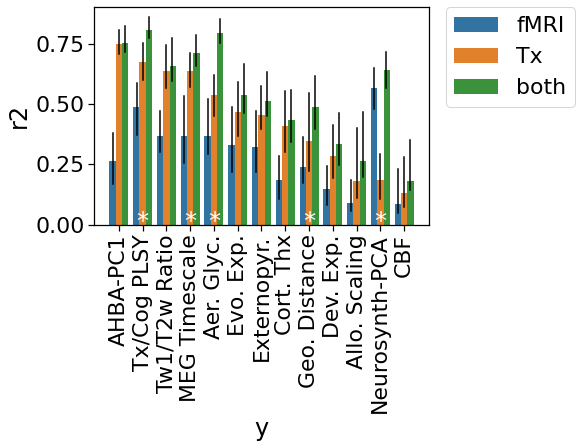

In [119]:
# now lets compare the results from each of the models to a model using both Tx and fMRI gradients

# results
g = sns.barplot(x='y',y='r2',hue='cond',data=regr,order=order_of_bars)
g.set_xticklabels(even_cleaner_labels,rotation=90)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# CIs from bootstrap
for i,feat in enumerate(order_of_bars):
    for cond,xloc in dict(zip(['fMRI','Tx','both'],[-0.25,0,0.25])).items():
        distr = sorted(Bregr[(Bregr.cond==cond) & \
                             (Bregr['y']==feat)].r2.values)
#         mn = Bregr[(regr.cond==cond) & \
#                              (regr['y']==feat)].r2.values[0]
        hi = distr[-2]
        lo = distr[3]
        plt.plot([i+xloc,i+xloc],[lo,hi],c='k')

    # significance testing
    winner = Bregr[(Bregr['y']==feat) & (Bregr.cond!='both')
                  ].groupby('cond').r2.mean().sort_values().index[-1]
    distr1 = sorted(Bregr[(Bregr.cond=='both') & (Bregr['y']==feat)].r2.values)
    distr2 = sorted(Bregr[(Bregr.cond==winner) & (Bregr['y']==feat)].r2.values)
    hilo = distr1[2]
    lohi = np.mean(distr2)
    if hilo > lohi:
        plt.text(i,0.01,'*',c='white',va='center',ha='center')
# plt.savefig(os.path.join(fig_dir,'MGvFGvALL_Barplot_ROTATED.pdf'),
#            bbox_inches='tight')

# Neurosynth analysis

Below is a very janky script that will download v4 topic metanalysis maps from neurosynth directly from the website, while pulling some metadata about the topics. The script then combines with a quick bash script that converts the volumetric data to surface and writes data to a descriptive filename.

Since this script is entirely dependent on the HTML structure of the neurosynth website, which could change at any time, it is very likely that this script will quickly be deprecated. But its skeleton should at least be useful for adapting.

Also, this might actually be against Neurosynth's rules. Ideally, one would use the Neurosynth api to download these topics. However, I did not see any obvious examples of pulling the meta-analytic topic maps from the tutorials or documentation, so figured it would be faster to just draft up my own code.

In [84]:
import urllib.request
import json
from shutil import copy2
import subprocess
from bs4 import BeautifulSoup as bs
import re

log = []

datadir = 'neurosynth_topics/'
if not os.path.isdir(datadir):
    os.mkdir(datadir)
tst = os.path.join(datadir,'test.txt')
tmp = os.path.join(datadir,'tmp.nii.gz')
tmpgii = os.path.join(datadir,'tmp.func.gii')
# cmd = 'bash ./code/nsynth_vol2surf.sh'
cmd = 'wb_command -volume-to-surface-mapping neurosynth_topics/tmp.nii.gz surf/S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii neurosynth_topics/tmp.func.gii -enclosing'
termdf = pandas.DataFrame(index=range(100))

for i in range(10938,11338):
#for i in range(10938,10939):
    url = 'https://neurosynth.org/api/images/%s/'%i
    try:
        urllib.request.urlretrieve(url, tst)
    except:
        print("FAILURE for %s"%url)
        log.append('Couldnt find datalog %s'%url)
        continue
    with open(tst) as json_data:
        j = json.load(json_data)
    labl = j['data']['label']
    if 'topics-100' in labl: 
        if ': uniformity test' in labl or ': association test' in labl:
            jnk = labl.split('_')
            newurl = os.path.join(url,'download/')
            path = '%s_T%s_%s_%s.nii.gz'%(jnk[-1].split(' ')[1],jnk[1],jnk[2],jnk[3])
            path = os.path.join(datadir,path)
            print('Downloading',path)
            try:
                urllib.request.urlretrieve(newurl, path)
            except:
                print("FAILURE for %s"%newurl)
                log.append('Couldnt find image %s'%newurl)
                continue
            print('converting to surf')
            copy2(path,tmp)
            process = subprocess.Popen(cmd.split(), stdout=subprocess.PIPE)
            output, error = process.communicate()
            if os.path.exists(tmpgii):
                print('success')
            else:
                print('gifti not created')
                break
            giipath = path.replace('.nii.gz','.func.gii')
            os.rename(tmpgii,giipath)
            
            if ': uniformity test' in labl: continue
            print('pulling terms')
            url = "https://neurosynth.org/analyses/topics/v4-topics-100/%s"%jnk[1]
            page = urllib.request.urlopen(url)
            html = page.read()
            page.close()
            canned = bs(html, 'html.parser')
            terms = []
            for tag in canned.find_all(re.compile("^h5")):
                a = tag.decode_contents()
                for term in a.split(','):
                    if 'href' in term:
                        term = term.split('>')[1][:-3]
                    terms.append(term.strip())
            termdf.loc[:len(terms)-1,jnk[1]] = terms

converting to surf
success
pulling terms
converting to surf
success
converting to surf
success
pulling terms
converting to surf
success
converting to surf
success
pulling terms
converting to surf
success
converting to surf
success
pulling terms
converting to surf
success
converting to surf
success
pulling terms
converting to surf
success
converting to surf
success
pulling terms
converting to surf
success
converting to surf
success
pulling terms
converting to surf
success
converting to surf
success
pulling terms
converting to surf
success
converting to surf
success
pulling terms
converting to surf
success
converting to surf
success
pulling terms
converting to surf
success
converting to surf
success
pulling terms
converting to surf
success
converting to surf
success
pulling terms
converting to surf
success
converting to surf
success
pulling terms
converting to surf
success
converting to surf
success
pulling terms
converting to surf
success
converting to surf
success
pulling terms
convert

In [85]:
# clean up and save
termdf.drop([x for x in termdf.index if all(pandas.isnull(y) for y in termdf.loc[x].values)],
            inplace=True)
termdf.drop(40,inplace=True)
termdf.to_csv(os.path.join(datadir,'v4-topics-100_terms.csv'))

In [86]:
termdf.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,stimulation,human,smokers,effect,stress,disease,object,phase,connectivity,attention,...,familiar,pet,bold,eye,correlated,motor,frequency,fear,food,reward
1,somatosensory,humans,users,increased,ptsd,patients,objects,rate,functional,attentional,...,recognition,flow,signal,eyes,positive,movement,alff,threat,taste,anticipation
2,tms,animal,smoking,participants,exposure,ad,visual,cycle,network,visual,...,false,tomography,dependent,movements,negative,movements,hz,conditioning,weight,monetary
3,tactile,neurons,drug,level,trauma,mci,shape,heart,resting,spatial,...,familiarity,emission,level,target,correlation,sensorimotor,amplitude,responses,obese,processing
4,primary,monkey,nicotine,behavioral,cortisol,alzheimer,color,menstrual,networks,search,...,items,positron,response,saccades,positively,primary,resting,anxiety,eating,rewards


In [87]:
termdf = pandas.read_csv(os.path.join(datadir,'v4-topics-100_terms.csv'),
                        index_col=0)
termdf.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,stimulation,human,smokers,effect,stress,disease,object,phase,connectivity,attention,...,familiar,pet,bold,eye,correlated,motor,frequency,fear,food,reward
1,somatosensory,humans,users,increased,ptsd,patients,objects,rate,functional,attentional,...,recognition,flow,signal,eyes,positive,movement,alff,threat,taste,anticipation
2,tms,animal,smoking,participants,exposure,ad,visual,cycle,network,visual,...,false,tomography,dependent,movements,negative,movements,hz,conditioning,weight,monetary
3,tactile,neurons,drug,level,trauma,mci,shape,heart,resting,spatial,...,familiarity,emission,level,target,correlation,sensorimotor,amplitude,responses,obese,processing
4,primary,monkey,nicotine,behavioral,cortisol,alzheimer,color,menstrual,networks,search,...,items,positron,response,saccades,positively,primary,resting,anxiety,eating,rewards


In [88]:
from glob import glob
giis = sorted(glob(os.path.join(datadir,'*.gii')))

In [89]:
# here we will load the giis and assess the overlay of their z-values
# with the component territories

nsynth = pandas.DataFrame() # to store results
count = 0
for g,gii in enumerate(giis):
    if g % 10 == 0: print('working on %s of %s'%((g+1),len(giis)))
    # load gii and get filename info
    surf_obj=nb.load(gii)
    ns=surf_obj.darrays[0].data
    string = os.path.split(gii)[1].split('_')
    # add info
    nsynth.loc[count,'test'] = string[0]
    nsynth.loc[count,'topic'] = string[1]
    nsynth.loc[count,'term1'] = string[2]
    nsynth.loc[count,'term2'] = string[3].split('.')[0]
    nsynth.loc[count,'size'] = len(ns[ns!=0])
    # for each Tx territory (cluster)
    for i in range(6):
        # get mean, sd and sem, as well as a measure of specificity
        vals = ns[labs==i]
        nsynth.loc[count,'Label%s_mn'%i] = np.mean(vals)
        nsynth.loc[count,'Label%s_sd'%i] = np.std(vals)
        nsynth.loc[count,'Label%s_sem'%i] = pandas.Series(vals).sem()
        if np.mean(ns[labs!=i]) != 0:
            nsynth.loc[count,'Label%s_spec'%i] = np.mean(vals) / np.mean(ns[labs!=i])
    count += 1

working on 1 of 199
working on 11 of 199
working on 21 of 199
working on 31 of 199
working on 41 of 199
working on 51 of 199
working on 61 of 199
working on 71 of 199
working on 81 of 199
working on 91 of 199
working on 101 of 199
working on 111 of 199
working on 121 of 199
working on 131 of 199
working on 141 of 199
working on 151 of 199
working on 161 of 199
working on 171 of 199
working on 181 of 199
working on 191 of 199


In [90]:
# have a quick look at top 5 topics for each label, looking at
# both association and uniformity.
# Association is usually the better map to look at
for test in ['association','uniformity']:
    print('='*7,test,'='*7)
    for i in range(6):
        print('>>>LABEL',i,'<<<')
        tops = nsynth[nsynth.test==test].sort_values('Label%s_mn'%i)[['Label%s_mn'%i,
                                                                     'topic','size',
                                                                     'term1','term2']] 
#         tops = nsynth[(nsynth.test==test) &\
#                       (nsynth['size']>500)].sort_values('Label%s_spec'%i)[['Label%s_spec'%i,
#                                                                      'topic','size',
#                                                                      'term1','term2']] 
        print(tops.dropna().tail(5))
        print(tops.dropna().head(5))
    
        print('\n')

======= association =======
>>>LABEL 0 <<<
    Label0_mn topic    size        term1          term2
0    0.848234    T0  2891.0  stimulation  somatosensory
69   0.848366   T72  2370.0        force          motor
29   0.932861   T36  2205.0       visual       auditory
84   1.141258   T86  3369.0       speech       auditory
94   2.616510   T95  8678.0        motor       movement
    Label0_mn topic    size      term1     term2
31  -0.037663   T38   929.0     volume      gray
56  -0.005084   T60  2813.0  emotional  negative
44   0.000000    T4    40.0     stress      ptsd
71   0.000000   T74    81.0        eeg    source
30   0.000000   T37     0.0  responses  response


>>>LABEL 1 <<<
    Label1_mn topic    size      term1     term2
6    0.663959   T15  5536.0    reading     words
8    0.673795   T17  2256.0     social   empathy
51   0.942851   T56  4297.0     events    memory
85   1.105893   T87  3616.0  sentences  language
57   1.488125   T61  3791.0       pain   painful
    Label1_mn to

My hypothesis going in was that the association tests would be more coherent, and that seems to be the case

In [91]:
# drop the following topics, which are not brain related
todrop = [1,3,8,10,11,12,16,18,19,26,27,31,35,37,38,41,43,44,45,53,54,55,69,74,76,78,79,82,91,92,94,96]
todrop = [str(x) for x in todrop]
tokeep = ['T%s'%x for x in termdf.columns if x not in todrop]

In [92]:
# make a supplemental table indicating which topics are included
termtable = pandas.DataFrame(termdf,copy=True)
termtable.columns = ['T%s'%x for x in termtable.columns]
termtable.index = ['Term%s'%x for x in termtable.index]
termtable = termtable.reindex(index = ['included'] + termtable.index.tolist())
termtable.loc['included',tokeep] = 'Yes'
termtable.loc['included',['T%s'%x for x in todrop]] = 'No'
termtable.to_csv('tables/Nsynth_term_inclusion.csv')
termtable.head()

,T0,T1,T2,T3,T4,T5,T6,T7,T8,T9,...,T90,T91,T92,T93,T94,T95,T96,T97,T98,T99
included,Yes,No,Yes,No,Yes,Yes,Yes,Yes,No,Yes,...,Yes,No,No,Yes,No,Yes,No,Yes,Yes,Yes
Term0,stimulation,human,smokers,effect,stress,disease,object,phase,connectivity,attention,...,familiar,pet,bold,eye,correlated,motor,frequency,fear,food,reward
Term1,somatosensory,humans,users,increased,ptsd,patients,objects,rate,functional,attentional,...,recognition,flow,signal,eyes,positive,movement,alff,threat,taste,anticipation
Term2,tms,animal,smoking,participants,exposure,ad,visual,cycle,network,visual,...,false,tomography,dependent,movements,negative,movements,hz,conditioning,weight,monetary
Term3,tactile,neurons,drug,level,trauma,mci,shape,heart,resting,spatial,...,familiarity,emission,level,target,correlation,sensorimotor,amplitude,responses,obese,processing


I experimented with a few different ways of visualizing the topics and terms associated with each molecular territory.

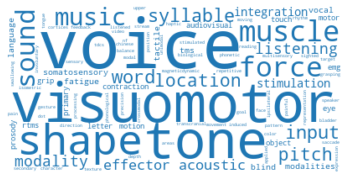

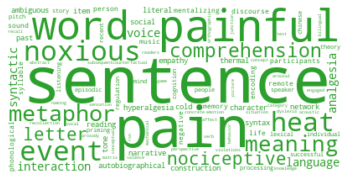

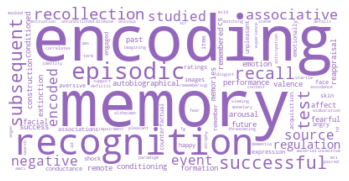

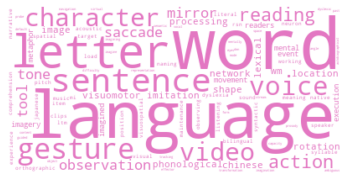

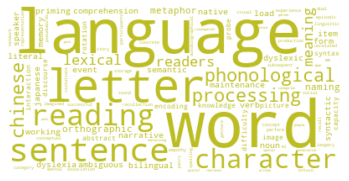

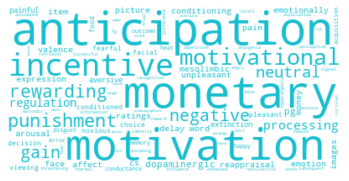

In [93]:
# Word clouds -- this was code more or less copied from
# Vogel et al., 2020 Nat Comms (Hippocampus-AP)
pal = sns.color_palette('tab10')
colors = [pal[0],pal[2],pal[4],pal[6],pal[8],pal[9]]
for lab in range(6):
    words = []
    trash = []
    for x,row in nsynth[(nsynth.test=='association') & (nsynth.topic.isin(tokeep))
                       ].iterrows():
        val = row['Label%s_mn'%lab]
        if val > 0:
            # get topic number
            topic = row['topic'].split('T')[-1]
            # get words associated with this topic
            desc = termdf[topic].tolist()
            # get weight based on HAGGIS
            Gwt = int(round(val*100))
            for i,word in enumerate(desc):
                # get rid of surrounding spaces
                if word in trash:
                    continue
                else:
                    trash.append(word)
                word = word.strip()
                # get rough weight based on LDA relevance
                Lwt = 40 - i
                # get final weight
                Fwt = Gwt * Lwt
                w_string = [word] * Fwt
                words += w_string
    jnk = np.array(words)
    np.random.shuffle(jnk)

    # ...and turn them into string
    words = ''
    for word in jnk:
        words += (word+' ')
    
    plt.close()
    cmap = tuple([int(round(x*255)) for x in colors[lab]])
    
    wc = wordcloud.WordCloud(max_words=100, background_color="white", 
                             color_func=lambda *args, **kwargs: cmap
                            ).generate(words)
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
#     plt.savefig(os.path.join(fig_dir,'WordCloud%s.pdf'%lab),
#                bbox_inches='tight')
    plt.show()

Also tried some overlapping barplots

In [94]:
# get the top 5 topics of each cluster
tpx = []
for lab in range(6):
    top = nsynth[(nsynth.test=='association') & (nsynth.topic.isin(tokeep))
                        ].sort_values('Label%s_mn'%lab).tail()
    tpx += top.topic.tolist()
stpx = np.unique(tpx)

In [95]:
# save the topic name for plotting and reference
for i,row in nsynth.iterrows():
    nm = '%s_%s_%s'%(row['topic'],row['term1'],row['term2'])
    nsynth.loc[i,'tname'] = nm

In [96]:
# order topics by relevance to different clusters
order = ['T15','T87','T86','T61','T17','T95','T72','T0','T36','T40','T14','T75',
        'T24','T60','T56','T65','T97','T99']
order = [nsynth[nsynth.topic==x]['tname'].values[0] for x in order]

Text(0.5, 0, '')

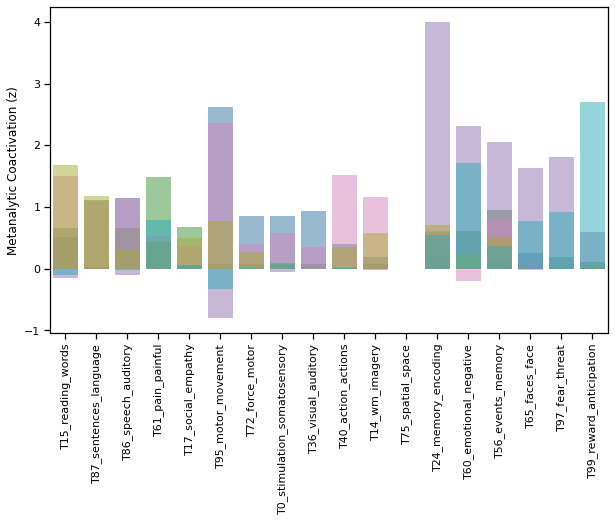

In [97]:
# fyi had to do a great deal of work in illustrator 
# to make all the bars visible

#sns.set_context('notebook',font_scale=2)
pal = sns.color_palette('tab10')
colors = [pal[0],pal[2],pal[4],pal[6],pal[8],pal[9]]
sns.set_context('notebook',font_scale=1)
plt.subplots(figsize=(10,6))
for lab in range(6):
    g = sns.barplot(y='Label%s_mn'%lab,x='tname',color = colors[lab],alpha=0.5,
                    order=order,
                data=nsynth[(nsynth.topic.isin(stpx)) & (nsynth.test=='association')])
    g.set_xticklabels(g.get_xticklabels(),rotation=90)
plt.ylabel('Metanalytic Coactivation (z)')
plt.xlabel('')
# plt.savefig(os.path.join(fig_dir,'NsynthBar.pdf'),
#            bbox_inches='tight')

In [98]:
jnk = pandas.DataFrame(nsynth[nsynth.test=='association'],copy=True)
jnk.loc[:,'ind'] = range(len(jnk))
tall = jnk.melt('ind',[x for x in jnk.columns if '_mn' in x],'clust','Z')
tall.loc[:,'tname'] = jnk.tname.tolist() * 6
tall.loc[:,'topic'] = jnk.topic.tolist() * 6

Here I try bar-bar plots which are bigger but more interpretable
This is what we go with in the Figure

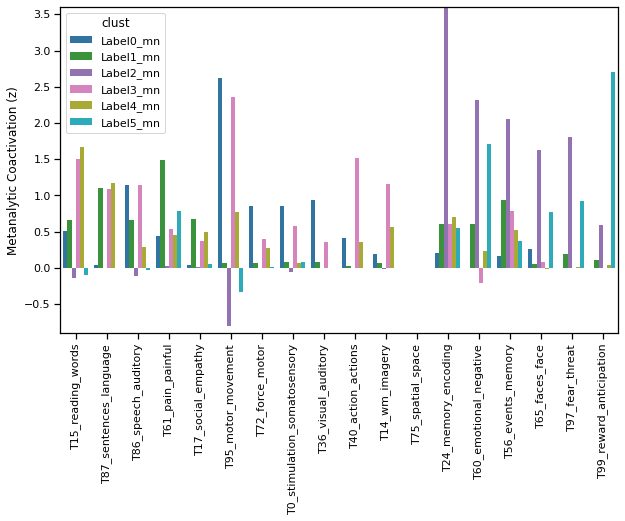

In [99]:
#sns.set_context('notebook',font_scale=2)
pal = sns.color_palette('tab10')
colors = [pal[0],pal[2],pal[4],pal[6],pal[8],pal[9]]
sns.set_context('notebook',font_scale=1)
plt.subplots(figsize=(10,6))
g = sns.barplot(y='Z',x='tname',palette = colors,order=order,hue='clust',
                data=tall[(tall.topic.isin(stpx))],)
g.set_xticklabels(g.get_xticklabels(),rotation=90)
plt.ylabel('Metanalytic Coactivation (z)')
plt.xlabel('')
plt.ylim(-0.9,3.6)
# plt.savefig(os.path.join(fig_dir,'NsynthBar2.pdf'),
#            bbox_inches='tight')
plt.show()

    


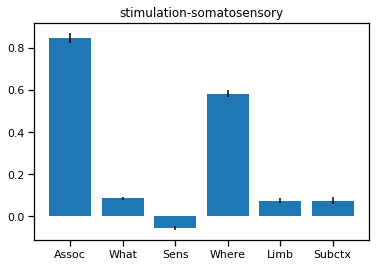

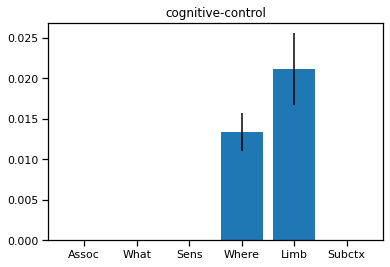

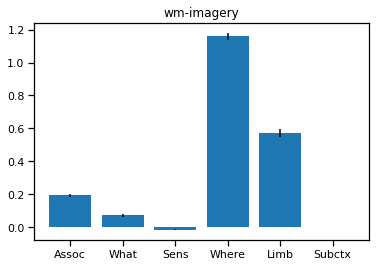

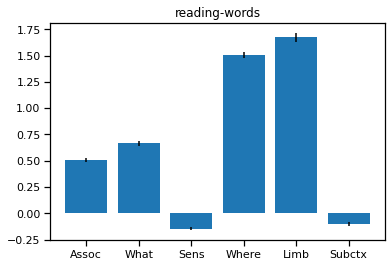

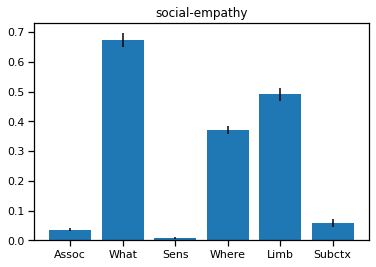

...

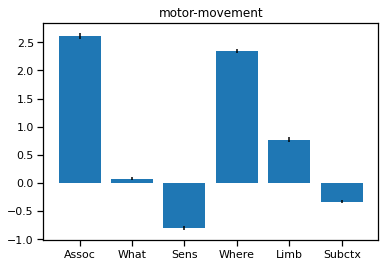

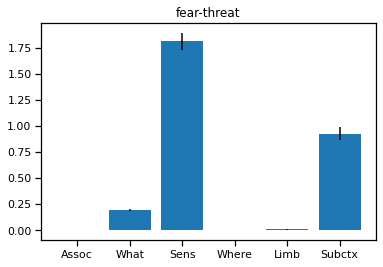

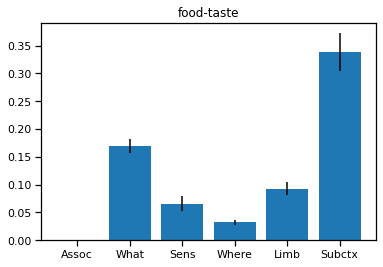

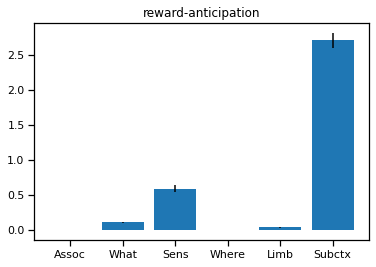

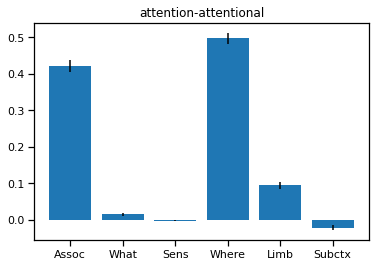

In [100]:
# This is in case you want to look at the relative overlap of each
# territory with each map
clusts = ['Assoc','What','Sens','Where','Limb','Subctx']
for i,row in nsynth[(nsynth.test=='association') & (nsynth.topic.isin(tokeep))].iterrows():
    mns = row[[x for x in nsynth.columns if 'mn' in x]]
    sems = row[[x for x in nsynth.columns if 'sem' in x]]
    plt.bar(clusts,mns.values,yerr=sems.values)
    plt.title('%s-%s'%(row['term1'],row['term2']))
    plt.show()

# Quick surface analysis for a supplemental figure

This is finishing up an analysis started in NB3_PLS_ModelExploration where we are looking at associations between the components and anatomical brain features. We wanted to plot C3 against T1/T2 ratio, but we did this specifically on the surface

Text(12.847999999999999, 0.5, 'LV 3 Expression')

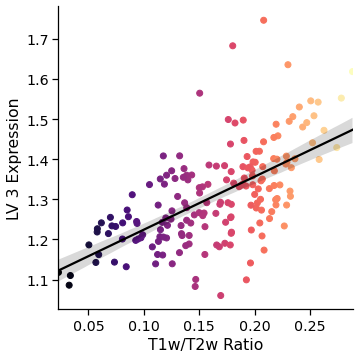

In [121]:
from matplotlib.colors import Normalize
sns.set_context('notebook',font_scale=1.3)

cmap = sns.color_palette('magma',as_cmap=True)
sg = featdf.TxGrad3.values
scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
norm = Normalize(vmin=np.min(scaled_sg), 
                               vmax=np.max(scaled_sg))
cscale = cmap(norm(scaled_sg))

sns.lmplot(x='TxGrad3',y='T1T2',data=featdf,
          scatter_kws={'color':cscale},line_kws={'color':'k'})
plt.xlabel('T1w/T2w Ratio')
plt.ylabel('LV 3 Expression')
#plt.savefig(os.path.join(fig_dir,'C3vfT1T2.pdf',bbox_inches='tight')

# MEG analysis
Many of the previous analyses showed that our Tx spatiomolecur gradients are distinct from functional gradients. But we would expect the Tx gradients to have some relationships with brain function. Here, we'll look at the distribution of MEG patterns at different timescales and see whether these share any spatial relationships with our Tx maps

First, we should look at spatial relationships between the MEG maps, Tx maps *and* fMRI maps

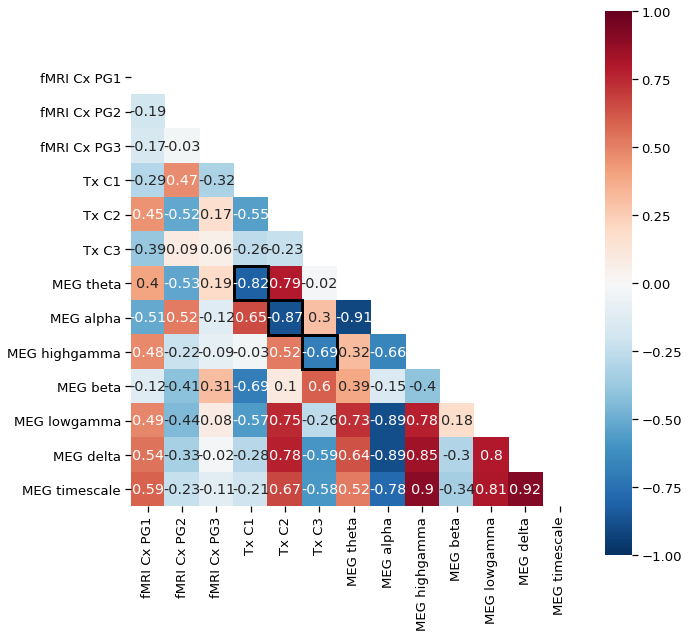

In [124]:
from matplotlib.patches import Rectangle

cols = ['MargGrad1', 'MargGrad2', 'MargGrad3', 'TxGrad1', 'TxGrad2', 'TxGrad3',
       'megtheta','megalpha','meggamma2','megbeta','meggamma1','megdelta',
       'megtimescale']
labs = ['fMRI Cx PG1','fMRI Cx PG2','fMRI Cx PG3','Tx C1','Tx C2','Tx C3',
       'MEG theta','MEG alpha','MEG highgamma','MEG beta','MEG lowgamma','MEG delta',
       'MEG timescale']

sns.set_context('notebook',font_scale=1.2)
plt.subplots(figsize=(10,10))

# plot a heatmap for a lower triangle connectivity matrix across all maps
jnk = pandas.DataFrame(np.corrcoef(featdf[cols].T),index=labs,columns=labs)
g=sns.heatmap(jnk.round(2),annot=True,center=0,cmap='RdBu_r',
            mask=np.triu(jnk),vmax=1,vmin=-1,square=True)

# highlight the strongest relationships for each Tx map
g.add_patch(Rectangle((3, 6), 1, 1, ec='black', fc='none', lw=3,))
g.add_patch(Rectangle((4, 7), 1, 1, ec='black', fc='none', lw=3,))
g.add_patch(Rectangle((5, 8), 1, 1, ec='black', fc='none', lw=3,))

# plt.savefig(os.path.join(fig_dir,'SFig_GradCMat.png',bbox_inches='tight')

Lets visualize those MEG <-> Tx relationships

Text(0.5, 21.92, 'Theta')

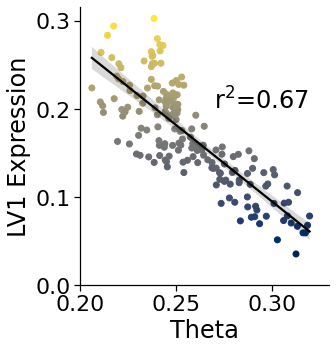

In [129]:
from matplotlib.colors import Normalize


sns.set_context('notebook',font_scale=2)

cmap = sns.color_palette('cividis',as_cmap=True)
sg = featdf.TxGrad1.values
scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
norm = Normalize(vmin=np.min(scaled_sg), vmax=np.max(scaled_sg))
cscale = cmap(norm(scaled_sg))

sns.lmplot(x='megtheta',y='TxGrad1',data=featdf,
          scatter_kws={'color':cscale},line_kws={'color':'k'})
r,p = stats.pearsonr(featdf.megtheta.values,featdf.TxGrad1.values)
plt.text(0.27,0.2,'r$^2$=%s'%round(r**2,2))
plt.xlim(0.2,0.33)
plt.ylim(0)
plt.ylabel('LV1 Expression')
plt.xlabel('Theta')
#plt.savefig(os.path.join(fig_dir,'Theta_C1.pdf'),bbox_inches='tight')

Text(0.5, 21.92, 'Alpha')

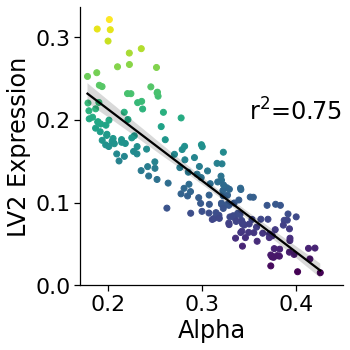

In [135]:
sns.set_context('notebook',font_scale=2)

cmap = sns.color_palette('viridis',as_cmap=True)
sg = featdf.TxGrad2.values
scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
norm = Normalize(vmin=np.min(scaled_sg), vmax=np.max(scaled_sg))
cscale = cmap(norm(scaled_sg))

sns.lmplot(x='megalpha',y='TxGrad2',data=featdf,
          scatter_kws={'color':cscale},line_kws={'color':'k'})
r,p = stats.pearsonr(featdf.megalpha.values,featdf.TxGrad2.values)
plt.text(0.35,0.2,'r$^2$=%s'%round(r**2,2))
plt.xlim(0.17,0.45)
plt.ylim(0)
plt.ylabel('LV2 Expression')
plt.xlabel('Alpha')
#plt.savefig(os.path.join(fig_dir,'Alpha_C2.pdf'),bbox_inches='tight')

Text(0.5, 21.92, 'High Gamma')

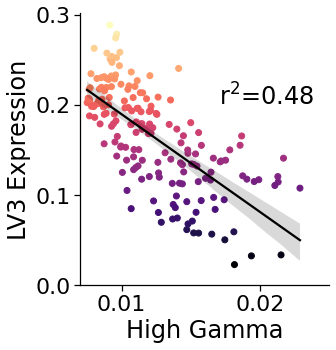

In [140]:
sns.set_context('notebook',font_scale=2)

cmap = sns.color_palette('magma',as_cmap=True)
sg = featdf.TxGrad3.values
scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
norm = Normalize(vmin=np.min(scaled_sg), vmax=np.max(scaled_sg))
cscale = cmap(norm(scaled_sg))

sns.lmplot(x='meggamma2',y='TxGrad3',data=featdf,
          scatter_kws={'color':cscale},line_kws={'color':'k'})
r,p = stats.pearsonr(featdf.meggamma2.values,featdf.TxGrad3.values)
plt.text(0.017,0.2,'r$^2$=%s'%round(r**2,2))
plt.xlim(0.007,0.025)
plt.ylim(0)
plt.ylabel('LV3 Expression')
plt.xlabel('High Gamma')
#plt.savefig(os.path.join(fig_dir,'Gamma2_C2.pdf'),bbox_inches='tight')

Let's plot those maps for the figure

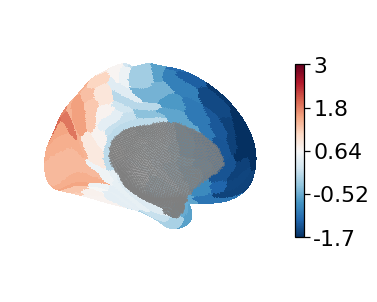

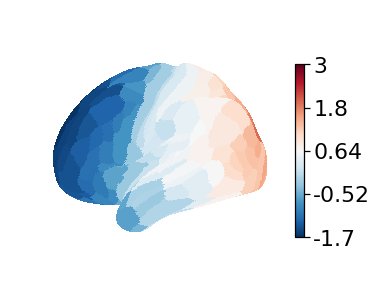

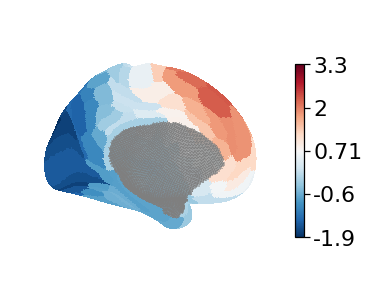

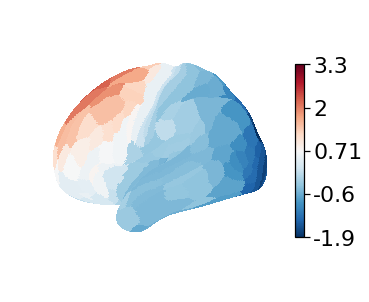

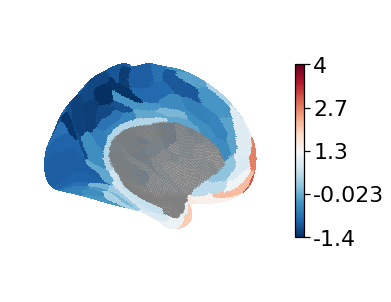

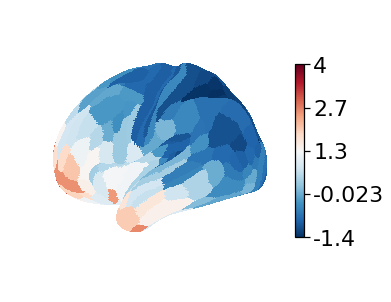

In [141]:
roikey = dict(zip(range(len(featdf)),np.unique(glasser)[1:]))
dat = np.zeros_like(glasser).astype(float)
for meg in ['megalpha','megtheta','meggamma2']:
    vals_tfm = StandardScaler().fit_transform(featdf.loc[:,meg].values.reshape(-1,1))[:,0]
    for i in featdf.index:
        dat[glasser==roikey[(i)]] = vals_tfm[i]
    plotting.plot_surf_roi(surface,dat,cmap='RdBu_r',
                      colorbar=True,view='medial')
    #plt.savefig(os.path.join(fig_dir,'%s.png'%meg),bbox_inches='tight')
    plotting.plot_surf_roi(surface,dat,cmap='RdBu_r',
                          colorbar=True,view='lateral')
    plt.show()

#### Spin test
Let's now make sure that these relationships are not just a matter of spatial autocorrelation

In [147]:
c1_nulls = [] # container for r-values
for col in spins.columns[:1000]: # we'll just to 1000 spins
    # we're only looking at one hemisphere, so first 180
    spun = featdf.loc[[(x-1) for x in spins[col].values if x < 181],'TxGrad1'].values 
    # run correlation between meg map and spun null Tx map
    c1_nulls.append(stats.pearsonr(spun,featdf['megtheta'])[0])

Text(0.5, 0, 'r')

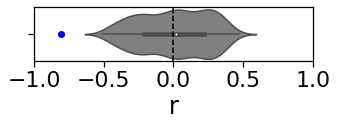

In [148]:
# plot the null distribution vs the empirical r-value

sns.set_context('notebook',font_scale=2)
plt.subplots(figsize=(5,1))
sns.violinplot(x=c1_nulls,color='gray')
plt.xlim(-1,1)
plt.axvline(0,ls='--',c='k')
plt.scatter(x=[-0.806],y=[0],c='b')
plt.xlabel('r')
#plt.savefig(os.path.join(fig_dir,'MegTheta_C1_null.pdf'),bbox_inches='tight')

Text(0.5, 0, 'r')

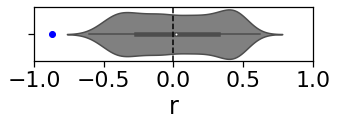

In [149]:
# now rinse and repeat for LV2, using a different set of spins
c2_nulls = []
for col in spins.columns[1000:2000]:
    spun = featdf.loc[[(x-1) for x in spins[col].values if x < 181],'TxGrad2'].values
    c2_nulls.append(stats.pearsonr(spun,featdf['megalpha'])[0])
    
plt.subplots(figsize=(5,1))
sns.violinplot(x=c2_nulls,color='gray')
plt.xlim(-1,1)
plt.axvline(0,ls='--',c='k')
plt.scatter(x=[-0.868],y=[0],c='b')
plt.xlabel('r')
#plt.savefig(os.path.join(fig_dir,'MegAlpha_C2_null.pdf'),bbox_inches='tight')

Text(0.5, 0, 'r')

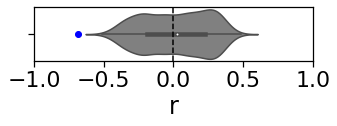

In [150]:
# and once more for C3
c3_nulls = []
for col in spins.columns[2000:3000]:
    spun = featdf.loc[[(x-1) for x in spins[col].values if x < 181],'TxGrad3'].values
    c3_nulls.append(stats.pearsonr(spun,featdf['meggamma2'])[0])

plt.subplots(figsize=(5,1))
sns.violinplot(x=c3_nulls,color='gray')
plt.xlim(-1,1)
plt.axvline(0,ls='--',c='k')
plt.scatter(x=[-0.685],y=[0],c='b')
plt.xlabel('r')
#plt.savefig(os.path.join(fig_dir,'MegGamma_C3_null.pdf'),bbox_inches='tight')